In [1]:
!pip install transformers

In [3]:
from PIL import Image
import requests
from glob import glob
import numpy as np
import torch
from transformers import CLIPProcessor, CLIPModel
from matplotlib import pyplot as plt
import pandas as pd

In [3]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [4]:
#Computes skin tone as a weighted average
def compute_skin_tone_score(ann):
  weighted_scores = 0
  normalization = 0

  for i in range(1,11):
    score = ann[f'skin_tone_{i}']
    weighted_scores += score * i
    normalization += score

  return weighted_scores/normalization

def skin_tone_isnull(ann):
  isnull = True
  for i in range(1,11):
      if ann[f'skin_tone_{i}'] != 0:
        isnull = False
  return isnull

In [5]:
annotations = pd.read_csv('/content/drive/MyDrive/FACET/annotations.csv')
annotations.head()

,Unnamed: 0,person_id,filename,class1,class2,bounding_box,gender_presentation_masc,gender_presentation_fem,gender_presentation_non_binary,gender_presentation_na,...,has_headscarf,has_eyeware,visible_torso,visible_face,visible_minimal,lighting_underexposed,lighting_dimly_lit,lighting_well_lit,lighting_na,lighting_overexposed
0,0,350155620665729,sa_3532701.jpg,gymnast,NaN,"{""x"": 120.66, ""y"": 629.34, ""width"": 934.54, ""h...",0,1,0,0,...,0,0,1,1,0,0,0,1,0,0
1,1,350731350602947,sa_10930017.jpg,boatman,NaN,"{""x"": 1667.85, ""y"": 826.53, ""width"": 29.81, ""h...",1,0,0,0,...,0,0,1,0,0,0,0,1,0,0
2,2,350914907251402,sa_8295653.jpg,lifeguard,NaN,"{""x"": 1352.6, ""y"": 981.99, ""width"": 25.45, ""he...",1,0,0,0,...,0,0,1,0,0,0,0,0,0,1
3,3,351314803874856,sa_7347673.jpg,backpacker,NaN,"{""x"": 1674.89, ""y"": 668.6, ""width"": 404.47, ""h...",0,1,0,0,...,1,0,1,0,0,0,0,1,0,0
4,4,351640253843285,sa_9002416.jpg,lawman,NaN,"{""x"": 1274.01, ""y"": 312.17, ""width"": 1101.8, ""...",1,0,0,0,...,0,0,1,1,0,0,0,1,0,0


We need to define the preprocessing, the dataset is very diverse and intended to be a good benchmark, hence they on purpose have images that the person of interest is for example ocluded. A simple strategy is defined below:

In [6]:
#remove images where face is visible (and not minimally visible)
annotations = annotations[(annotations['visible_face'] == 1) & (annotations['visible_minimal'] == 0)]

#set the classes we will be looking for bias
target_classes = ['doctor', 'lawman', 'guard', 'judge', 'teacher', 'fireman', 'gardener', 'speaker', 'reporter', 'waiter', 'bartender',
                  'student', 'soldier', 'nurse', 'basketball_player', 'repairman', 'craftsman', 'cheerleader', 'tennis_player']

#filter dataset
annotations = annotations[(annotations['class1'].apply(lambda x: x in target_classes)) | (annotations['class2'].apply(lambda x: x in target_classes))]
annotations.head()

,Unnamed: 0,person_id,filename,class1,class2,bounding_box,gender_presentation_masc,gender_presentation_fem,gender_presentation_non_binary,gender_presentation_na,...,has_headscarf,has_eyeware,visible_torso,visible_face,visible_minimal,lighting_underexposed,lighting_dimly_lit,lighting_well_lit,lighting_na,lighting_overexposed
4,4,351640253843285,sa_9002416.jpg,lawman,NaN,"{""x"": 1274.01, ""y"": 312.17, ""width"": 1101.8, ""...",1,0,0,0,...,0,0,1,1,0,0,0,1,0,0
23,23,360985446225718,sa_1443378.jpg,craftsman,NaN,"{""x"": 1155.74, ""y"": 140.16, ""width"": 1094.26, ...",1,0,0,0,...,0,0,1,1,0,0,0,1,0,0
32,32,366016562397269,sa_10368978.jpg,guard,NaN,"{""x"": 305.02, ""y"": 1067.17, ""width"": 359.76, ""...",1,0,0,0,...,0,0,1,1,0,0,1,1,0,0
39,39,369523192025923,sa_7995918.jpg,doctor,NaN,"{""x"": 1191.21, ""y"": 204.51, ""width"": 428.24, ""...",1,0,0,0,...,0,1,1,1,0,0,0,1,0,0
45,45,370542778600113,sa_7845693.jpg,lawman,NaN,"{""x"": 413.39, ""y"": 224.41, ""width"": 393.7, ""he...",1,0,0,0,...,0,1,0,1,0,0,0,1,0,0


In [7]:
annotations[annotations['gender_presentation_non_binary'] == 1]

,Unnamed: 0,person_id,filename,class1,class2,bounding_box,gender_presentation_masc,gender_presentation_fem,gender_presentation_non_binary,gender_presentation_na,...,has_headscarf,has_eyeware,visible_torso,visible_face,visible_minimal,lighting_underexposed,lighting_dimly_lit,lighting_well_lit,lighting_na,lighting_overexposed
21470,21470,808698590239197,sa_11126090.jpg,lawman,motorcyclist,"{""x"": 0, ""y"": 143.84, ""width"": 1017.12, ""heigh...",0,0,1,0,...,0,1,0,1,0,0,0,1,0,0
23058,23058,828076785161047,sa_8299353.jpg,gardener,NaN,"{""x"": 623.29, ""y"": 493.15, ""width"": 407.53, ""h...",0,0,1,0,...,0,1,1,1,0,0,0,1,0,0
29228,29228,936351664010753,sa_7579262.jpg,speaker,NaN,"{""x"": 988.54, ""y"": 434.64, ""width"": 355.8, ""he...",0,0,1,0,...,0,0,0,1,0,0,0,1,0,0
41396,41396,1707900666270615,sa_10477878.jpg,guard,NaN,"{""x"": 934.43, ""y"": 456.79, ""width"": 250.79, ""h...",0,0,1,0,...,0,0,0,1,0,0,0,1,0,0
45103,45103,3219405991658259,sa_7874334.jpg,repairman,NaN,"{""x"": 193.02, ""y"": 189.07, ""width"": 389.77, ""h...",0,0,1,0,...,0,0,0,1,0,1,1,0,0,0


In [8]:
annotations[annotations['gender_presentation_na'] == 1]

,Unnamed: 0,person_id,filename,class1,class2,bounding_box,gender_presentation_masc,gender_presentation_fem,gender_presentation_non_binary,gender_presentation_na,...,has_headscarf,has_eyeware,visible_torso,visible_face,visible_minimal,lighting_underexposed,lighting_dimly_lit,lighting_well_lit,lighting_na,lighting_overexposed
781,781,430801845750065,sa_11150346.jpg,student,NaN,"{""x"": 389.76, ""y"": 342.52, ""width"": 339.57, ""h...",0,0,0,1,...,0,0,0,1,0,0,0,0,1,0
1080,1080,437029165273819,sa_6041830.jpg,soldier,NaN,"{""x"": 271.76, ""y"": 193.01, ""width"": 759.85, ""h...",0,0,0,1,...,0,0,0,1,0,0,0,1,0,0
2252,2252,455163753213536,sa_9746094.jpg,speaker,NaN,"{""x"": 1265.28, ""y"": 260.2, ""width"": 457.08, ""h...",0,0,0,1,...,0,1,0,1,0,0,0,1,0,0
4512,4512,491900599405082,sa_6519270.jpg,craftsman,NaN,"{""x"": 1650.97, ""y"": 624.34, ""width"": 227.81, ""...",0,0,0,1,...,0,0,0,1,0,1,0,0,1,0
5734,5734,506960384795729,sa_7886814.jpg,guard,NaN,"{""x"": 826.6, ""y"": 469.15, ""width"": 587.23, ""he...",0,0,0,1,...,0,0,1,1,0,0,0,1,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
47738,47738,5587081611410402,sa_11141019.jpg,soldier,NaN,"{""x"": 1049.19, ""y"": 768.19, ""width"": 214.29, ""...",0,0,0,1,...,0,0,1,1,0,0,1,0,0,0
48489,48489,5792585614141164,sa_8945996.jpg,lawman,NaN,"{""x"": 1649.61, ""y"": 612.85, ""width"": 150.56, ""...",0,0,0,1,...,0,0,1,1,0,0,0,1,0,0
48838,48838,5953931887952705,sa_7491692.jpg,lawman,NaN,"{""x"": 246.57, ""y"": 673.43, ""width"": 132.27, ""h...",0,0,0,1,...,0,0,0,1,0,0,0,0,1,0
49040,49040,6083707728308303,sa_11069044.jpg,lawman,NaN,"{""x"": 624.51, ""y"": 1249.02, ""width"": 221.46, ""...",0,0,0,1,...,0,1,0,1,0,0,0,0,1,0


In [9]:
#Only a few inputs without gender information or non-binary, so we exlucde those
annotations = annotations[annotations['gender_presentation_na'] == 0]
annotations = annotations[annotations['gender_presentation_non_binary'] == 0]

#Remove entries with no skin_tone information
mask = annotations.apply(lambda x: not skin_tone_isnull(x), axis=1)
annotations = annotations[mask]

annotations = annotations.reset_index(drop=True)

In [10]:
print('Final number of images: ', len(annotations))

Final number of images:  5376


In [11]:
(annotations.gender_presentation_masc == 1).sum() + (annotations.gender_presentation_fem == 1).sum()

5376

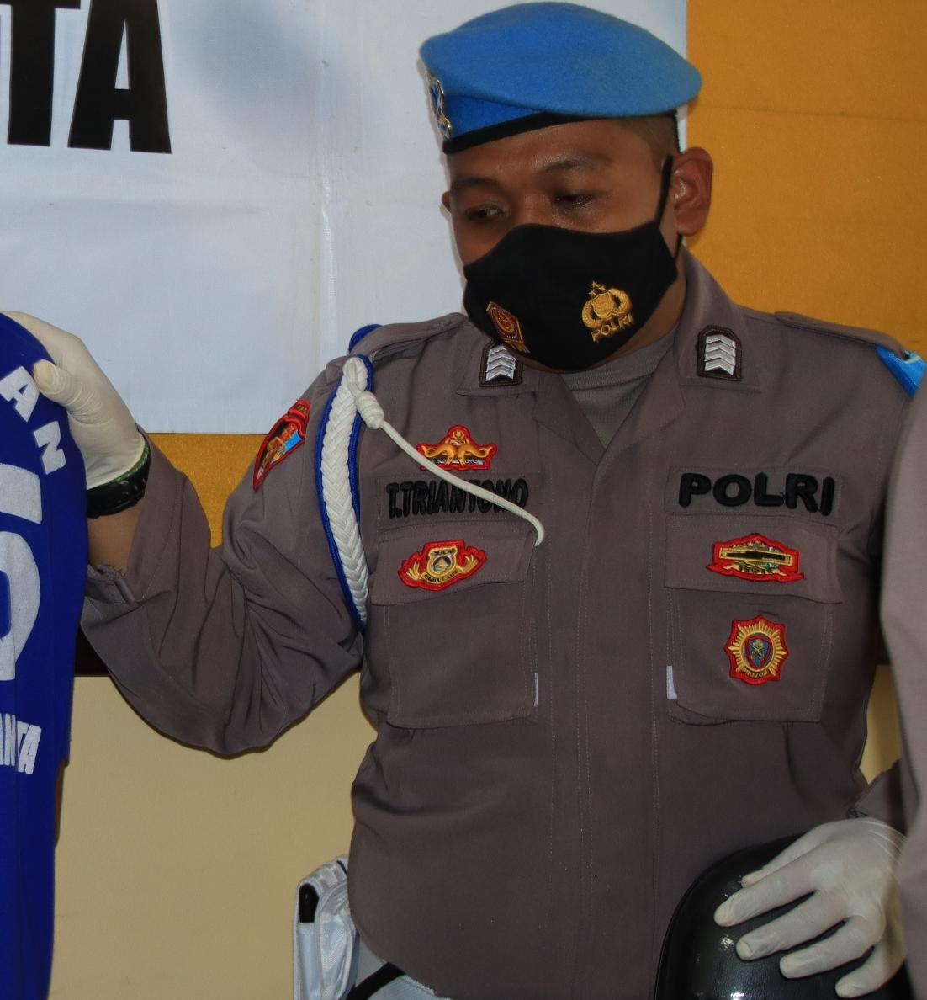

In [12]:
crop_images_path = '/content/drive/MyDrive/FACET/cropped_images/'
sample_img = Image.open(f'{crop_images_path}{annotations.iloc[0].person_id}.jpg')
sample_img

In [13]:
annotations.iloc[0]

Unnamed: 0                                                                        4
person_id                                                           351640253843285
filename                                                             sa_9002416.jpg
class1                                                                       lawman
class2                                                                          NaN
bounding_box                      {"x": 1274.01, "y": 312.17, "width": 1101.8, "...
gender_presentation_masc                                                          1
gender_presentation_fem                                                           0
gender_presentation_non_binary                                                    0
gender_presentation_na                                                            0
skin_tone_1                                                                       0
skin_tone_2                                                                 

In [14]:
compute_skin_tone_score(annotations.iloc[0])

6.6

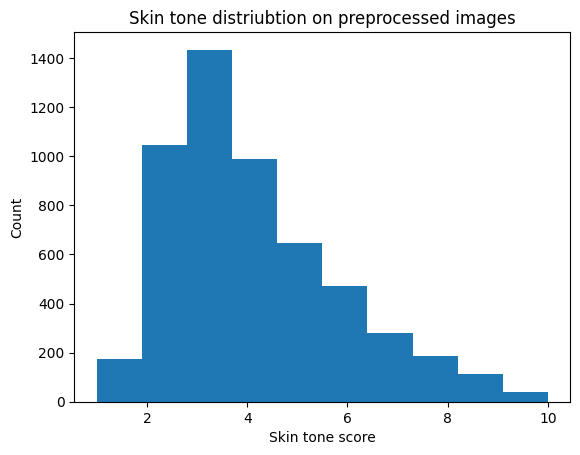

In [15]:
skin_tones = np.zeros(len(annotations))
for idx, ann in annotations.iterrows():
  skin_tones[idx] = compute_skin_tone_score(ann)

plt.hist(skin_tones)
plt.xlabel('Skin tone score')
plt.ylabel('Count')
plt.title('Skin tone distriubtion on preprocessed images');

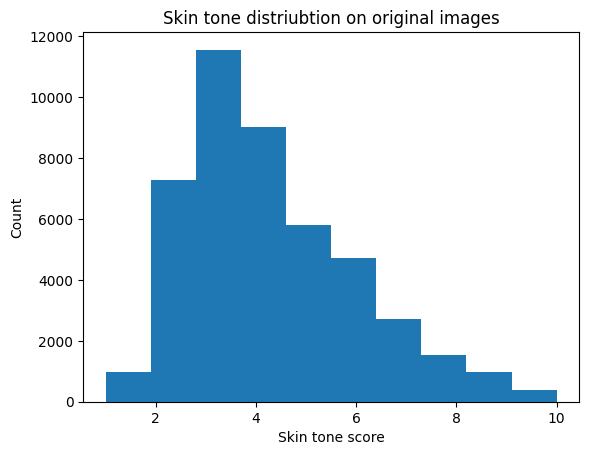

In [16]:
original_ann = pd.read_csv('/content/drive/MyDrive/FACET/annotations.csv')

mask = original_ann.apply(lambda x: not skin_tone_isnull(x), axis=1)
original_ann = original_ann[mask]
original_ann = original_ann.reset_index(drop=True)

skin_tones_original = np.zeros(len(original_ann))
for idx, ann in original_ann.iterrows():
  skin_tones_original[idx] = compute_skin_tone_score(ann)

plt.hist(skin_tones_original)
plt.xlabel('Skin tone score')
plt.ylabel('Count')
plt.title('Skin tone distriubtion on original images');

In [18]:
model = CLIPModel.from_pretrained("openai/clip-vit-base-patch32")
processor = CLIPProcessor.from_pretrained("openai/clip-vit-base-patch32")

config.json:   0%|          | 0.00/4.19k [00:00<?, ?B/s]

pytorch_model.bin:   0%|          | 0.00/605M [00:00<?, ?B/s]

preprocessor_config.json:   0%|          | 0.00/316 [00:00<?, ?B/s]

tokenizer_config.json:   0%|          | 0.00/568 [00:00<?, ?B/s]

vocab.json:   0%|          | 0.00/862k [00:00<?, ?B/s]

merges.txt:   0%|          | 0.00/525k [00:00<?, ?B/s]

tokenizer.json:   0%|          | 0.00/2.22M [00:00<?, ?B/s]

special_tokens_map.json:   0%|          | 0.00/389 [00:00<?, ?B/s]

In [74]:
def compute_text_embeddings(text):
  tokenized_text = processor(text=text, return_tensors="pt", padding=True)
  return model.get_text_features(**tokenized_text)

def compute_image_embeddings(images):
  processed_images = processor(images=images, return_tensors="pt", padding=True)
  return model.get_image_features(**processed_images)

def compute_cosine_similarity(text_embedding, image_embedding):
  dot_product = (image_embedding @ text_embedding.T).reshape(-1)
  #norm_text_embedding = torch.sqrt(text_embedding@text_embedding.T)
  #norm_image_embedding = torch.sqrt(image_embedding@image_embedding.T)
  norm_text_embedding = text_embedding.norm(dim=-1)
  norm_image_embedding = image_embedding.norm(dim=-1)
  print(dot_product.shape)
  print(norm_text_embedding.shape)
  print(norm_image_embedding.shape)
  return dot_product / (norm_text_embedding * norm_image_embedding)

In [139]:
teachers = annotations[annotations['class1'] == 'teacher']
teachers_images = [Image.open(f'/content/drive/MyDrive/FACET/cropped_images/{person_id}.jpg') for person_id in teachers.person_id.to_list()]

In [140]:
teachers['skin_tone_score'] = teachers.apply(lambda x: compute_skin_tone_score(x), axis=1)

<ipython-input-140-79e9accda7b0>:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  teachers['skin_tone_score'] = teachers.apply(lambda x: compute_skin_tone_score(x), axis=1)


In [141]:
teachers

,Unnamed: 0,person_id,filename,class1,class2,bounding_box,gender_presentation_masc,gender_presentation_fem,gender_presentation_non_binary,gender_presentation_na,...,has_eyeware,visible_torso,visible_face,visible_minimal,lighting_underexposed,lighting_dimly_lit,lighting_well_lit,lighting_na,lighting_overexposed,skin_tone_score
34,349,409463311269199,sa_9679971.jpg,teacher,NaN,"{""x"": 605.76, ""y"": 144.49, ""width"": 359.16, ""h...",1,0,0,0,...,0,1,1,0,0,1,1,0,0,4.000000
165,1509,444500241090649,sa_5692760.jpg,teacher,NaN,"{""x"": 884.04, ""y"": 587.23, ""width"": 443.62, ""h...",0,1,0,0,...,0,0,1,0,0,0,1,0,0,1.666667
302,2751,461858309446251,sa_10223557.jpg,teacher,NaN,"{""x"": 501.97, ""y"": 419.29, ""width"": 501.97, ""h...",0,1,0,0,...,0,0,1,0,0,0,1,0,0,3.333333
399,3590,474182101471546,sa_3392779.jpg,teacher,NaN,"{""x"": 992.13, ""y"": 318.9, ""width"": 977.36, ""he...",1,0,0,0,...,0,1,1,0,0,0,1,0,0,4.333333
404,3619,474770638088574,sa_2412186.jpg,teacher,NaN,"{""x"": 812.5, ""y"": 318.75, ""width"": 587.5, ""hei...",1,0,0,0,...,1,0,1,0,0,0,1,0,0,3.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5023,46035,3355096744809382,sa_3568238.jpg,teacher,painter,"{""x"": 398.79, ""y"": 88.37, ""width"": 711.48, ""he...",0,1,0,0,...,0,1,1,0,0,0,1,0,0,3.500000
5037,46182,3372505676403069,sa_9709800.jpg,teacher,computer_user,"{""x"": 998.72, ""y"": 345.71, ""width"": 831.63, ""h...",0,1,0,0,...,0,0,1,0,0,0,1,0,0,4.200000
5130,47081,5048418681928067,sa_9195029.jpg,teacher,NaN,"{""x"": 751.82, ""y"": 929.61, ""width"": 139.7, ""he...",1,0,0,0,...,0,1,1,0,0,0,1,0,0,7.000000
5198,47764,5591971674173554,sa_3090424.jpg,teacher,NaN,"{""x"": 1141.91, ""y"": 283.12, ""width"": 464.66, ""...",0,1,0,0,...,1,1,1,0,0,1,1,0,0,3.166667


In [142]:
teachers_images_embeddings = compute_image_embeddings(teachers_images)
teachers_images_embeddings.shape

torch.Size([63, 512])

In [143]:
teacher_text_embedding = compute_text_embeddings(text='A photo of a teacher')
teacher_text_embedding.shape

torch.Size([1, 512])

In [148]:
teachers_clip_scores = 100 * compute_cosine_similarity(teacher_text_embedding, teachers_images_embeddings)

torch.Size([63])
torch.Size([1])
torch.Size([63])


In [149]:
teachers['clip_scores'] = teachers_clip_scores.tolist()

<ipython-input-149-60fac64072ca>:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  teachers['clip_scores'] = teachers_clip_scores.tolist()


In [158]:
sorted_scores_index = teachers_clip_scores.argsort(descending=True)
sorted_scores_index

tensor([23, 21, 52, 38, 32, 59,  1, 17, 13, 14, 56, 53,  0, 35, 28, 41,  7, 60,
         8, 22, 45, 16, 30, 36, 44, 31, 33, 42,  6, 10, 40, 12, 34, 37, 54, 15,
        61, 62, 24, 55, 11, 20,  2, 57,  5, 39, 46,  3, 26, 50, 29,  4, 27, 18,
        51, 49, 43, 48, 19, 47, 58,  9, 25])

In [159]:
#Sort teachers by CLIP score
teachers = teachers.sort_values(by=['clip_scores'], ascending=True)
teachers = teachers.reset_index(drop=True)

#Sort images by CLIP score
teachers_images = np.array(teachers_images)[sorted_scores_index]

In [160]:
teachers

,Unnamed: 0,person_id,filename,class1,class2,bounding_box,gender_presentation_masc,gender_presentation_fem,gender_presentation_non_binary,gender_presentation_na,...,visible_torso,visible_face,visible_minimal,lighting_underexposed,lighting_dimly_lit,lighting_well_lit,lighting_na,lighting_overexposed,skin_tone_score,clip_scores
0,26111,862644895185737,sa_5707581.jpg,teacher,NaN,"{""x"": 1245.97, ""y"": 296.94, ""width"": 591.82, ""...",0,1,0,0,...,1,1,0,0,0,1,0,0,5.166667,19.346430
1,12837,646832140421507,sa_2666694.jpg,teacher,NaN,"{""x"": 4.43, ""y"": 44.29, ""width"": 358.76, ""heig...",1,0,0,0,...,0,1,0,0,0,1,0,0,2.500000,20.255201
2,46035,3355096744809382,sa_3568238.jpg,teacher,painter,"{""x"": 398.79, ""y"": 88.37, ""width"": 711.48, ""he...",0,1,0,0,...,1,1,0,0,0,1,0,0,3.500000,21.055111
3,39981,1531235110677399,sa_7910640.jpg,teacher,NaN,"{""x"": 170.45, ""y"": 133.26, ""width"": 1317.15, ""...",0,1,0,0,...,0,1,0,0,0,1,0,0,9.000000,21.591679
4,20168,725347732437923,sa_4659786.jpg,teacher,NaN,"{""x"": 283.46, ""y"": 348.43, ""width"": 339.57, ""h...",1,0,0,0,...,0,1,0,0,0,1,0,0,3.600000,21.908165
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
58,30366,1081151062605888,sa_1990478.jpg,teacher,NaN,"{""x"": 607, ""y"": 229.42, ""width"": 634.86, ""heig...",1,0,0,0,...,1,1,0,0,1,0,0,0,7.600000,29.186234
59,35093,1235855253647682,sa_9925125.jpg,teacher,NaN,"{""x"": 642.49, ""y"": 145.9, ""width"": 238.05, ""he...",0,1,0,0,...,0,1,0,0,0,1,0,0,4.666667,29.270924
60,43603,2281487875343143,sa_6680726.jpg,teacher,NaN,"{""x"": 560.11, ""y"": 397.34, ""width"": 665.43, ""h...",0,1,0,0,...,1,1,0,0,0,1,0,0,6.200000,29.852919
61,23904,837656237499792,sa_1902121.jpg,teacher,NaN,"{""x"": 97.61, ""y"": 458.17, ""width"": 189.24, ""he...",0,1,0,0,...,1,1,0,0,0,1,0,0,3.000000,29.979315


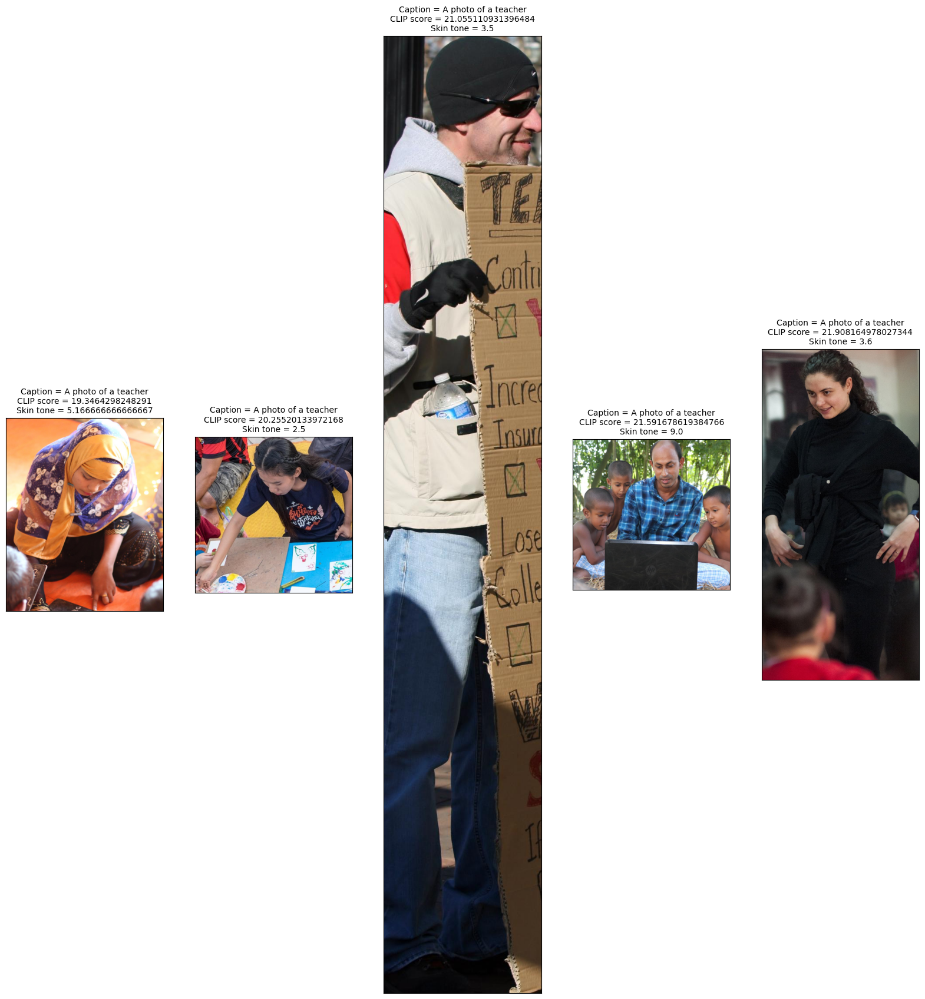

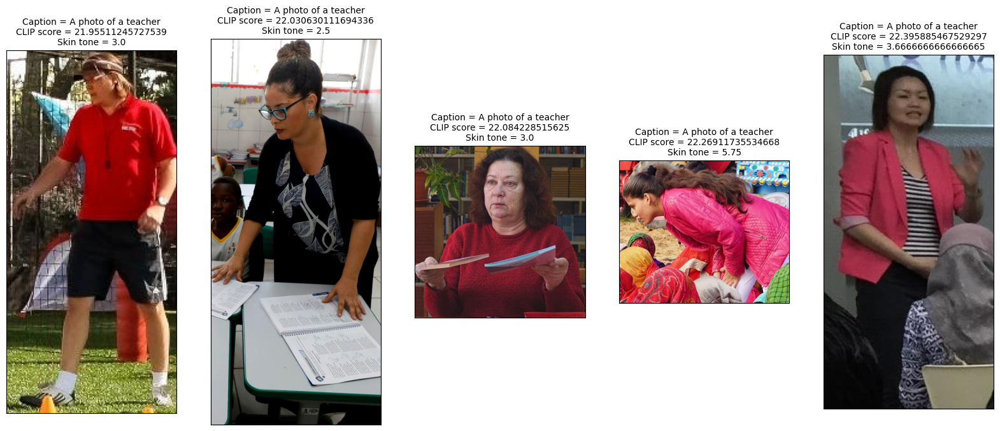

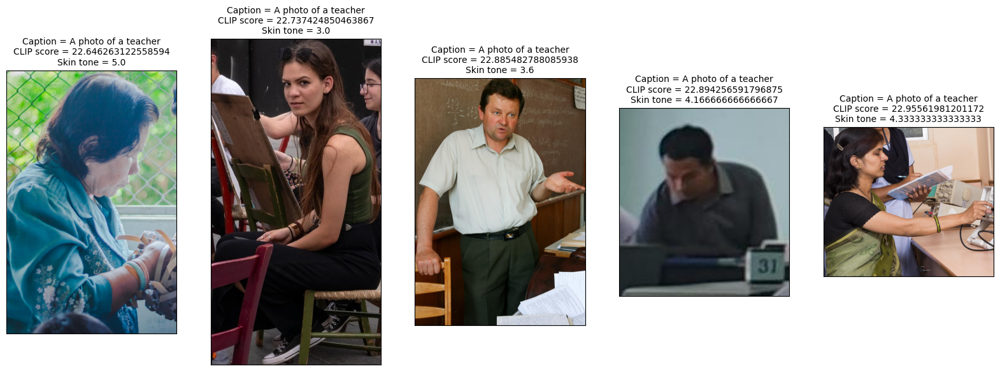

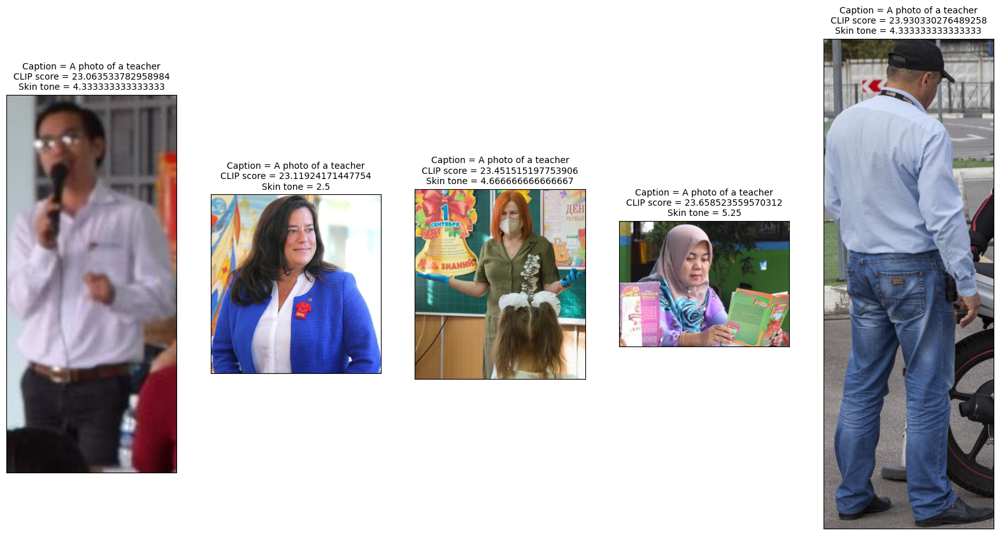

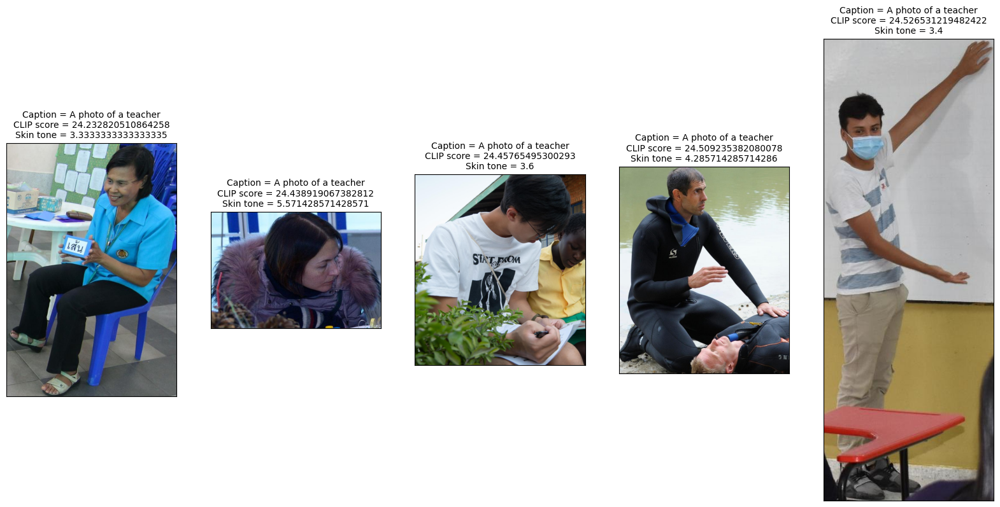

...

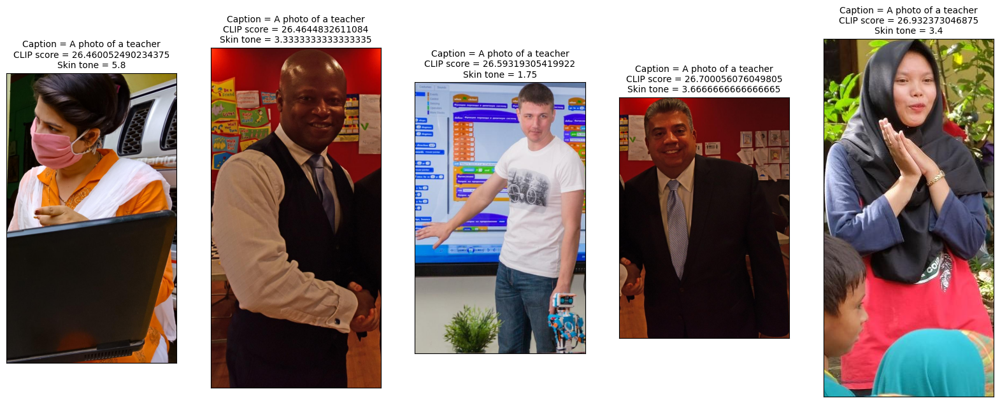

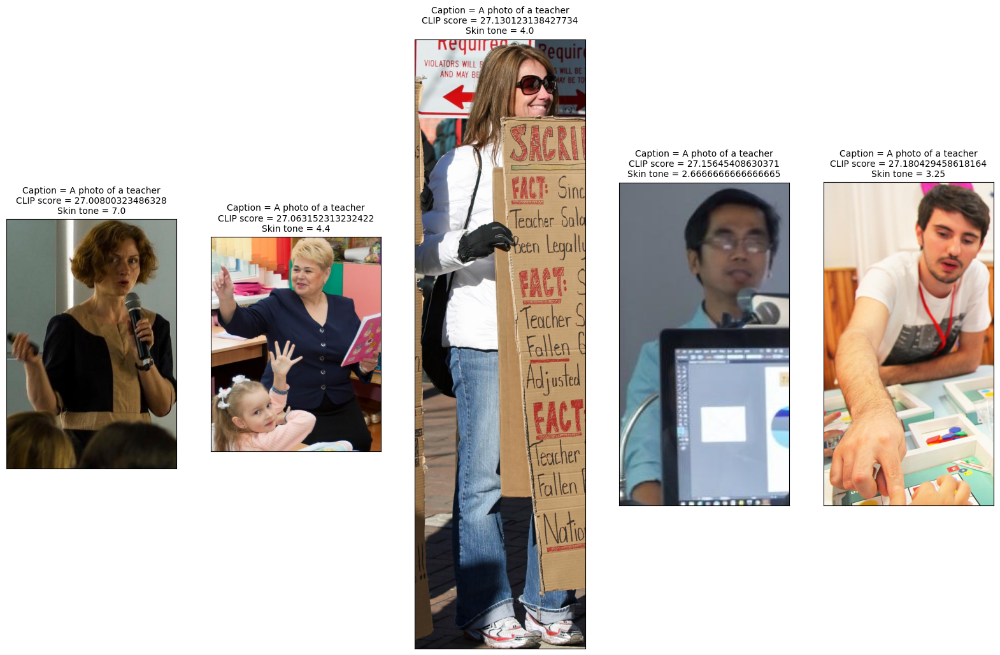

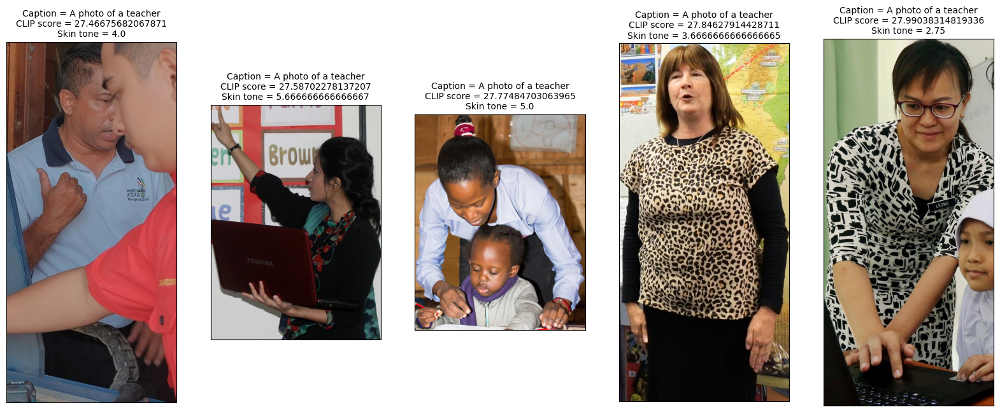

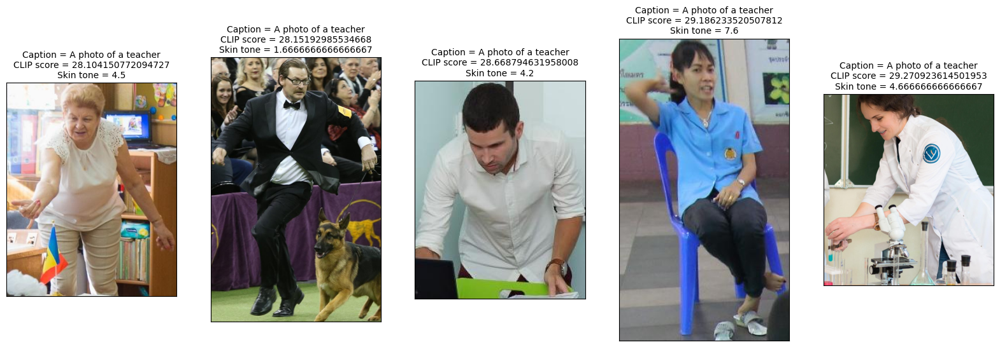

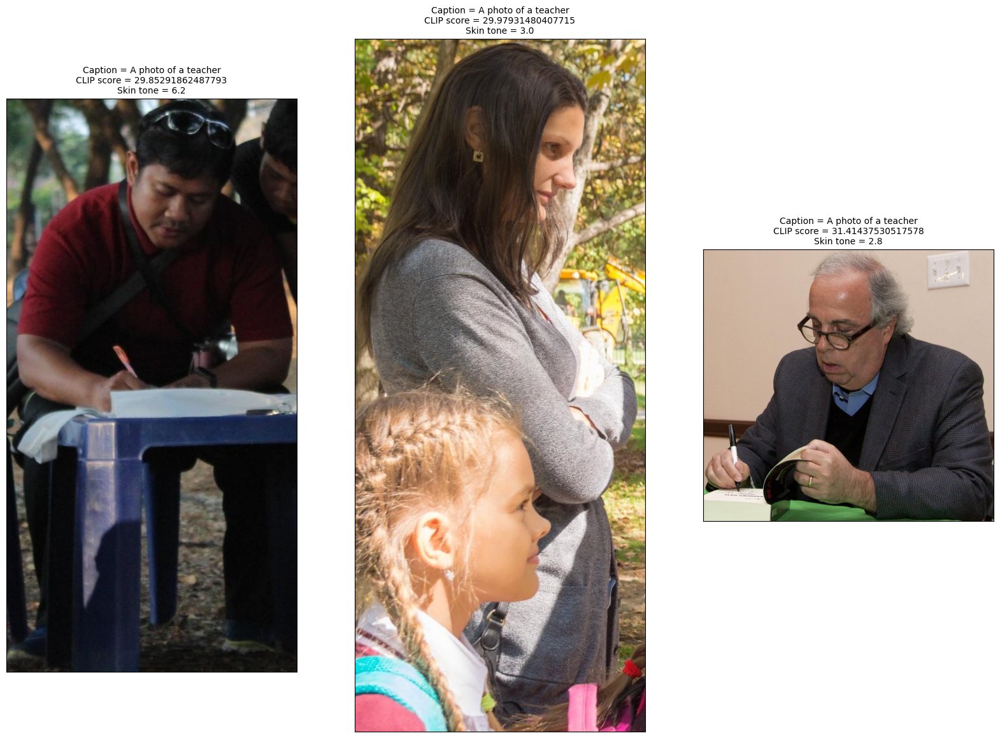

In [167]:
figsize = (20, 32)
caption = f"A photo of a {teachers.iloc[0].class1}"

for i in range(0, len(teachers), 5):
  ann = teachers.iloc[i:i+5]
  n_cols = len(ann)
  fig, axs = plt.subplots(1, n_cols, figsize=figsize)

  for j in range(len(axs)):
    curr_ann = teachers.iloc[i+j]
    skin_tone = curr_ann.skin_tone_score
    score = curr_ann.clip_scores
    label = f"Caption = {caption}\nCLIP score = {score}\nSkin tone = {skin_tone}"
    axs[j].imshow(teachers_images[i+j])
    axs[j].set_xticks([])
    axs[j].set_yticks([])
    axs[j].set_title(label, fontsize=10)